In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [1]:
import torch
for i in range(torch.cuda.device_count()):
   print(torch.cuda.get_device_properties(i).name)

Tesla P100-PCIE-16GB


# GM0 Performance Evaluation

**IMPORTANT**: This notebook should be used as a base for the evaluation of different models. 

- Please **make a copy of this notebook** whenever you want to evaluate a model. Load the desired model by changing the following `model_path_str` variable. 
- This notebook is currently not saving any generated plot. Please make sure to not overwrite the outputs, or to save the plots whenever needed. 
- This notebook saves the generated data. Please refer to the Evaluation section of this notebook. 

Available models on the SDSC shared folder: 

In [3]:
!ls /store/sdsc/sd28/models/GM0/diffusion/

1D-UNET-DDPM-envelope
consistency-model-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05
ddim-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05
ddim-pred:epsilon-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05
ddim-pred:epsilon-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:1_LogSpectrogram-{}
ddim-pred:sample-1D-downsampling:1_SignalWithEnvelope-first_order_lp-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:1_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:1_SignalWithEnvelope-moving_average-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:2_LogSpectrogram-{}
ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-first_order_lp-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-dow

In [3]:
models_folder = "../outputs/"

One can either choose a specific checkpoint of a model or the most recent checkpoint of that model (default):

In [4]:
# Pick the last checkpoint of the model
model_path_str = models_folder + "ddim-pred:sample-2D-downsampling:2_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=203-val_loss=0.01.ckpt"

# Or pick a specific checkpoint
# model_path_str = dataset_folder + "/ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average_shifted-log-log_offset:1.0e-05-normalize-scalar:True/name=0_epoch=125-val_loss=0.02.ckpt"

Import the needed libraries, modules and needed variables

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import os

from pathlib import Path
from tqdne.utils import *
from tqdne.conf import Config
from tqdne.metric import *

from tqdne.dataset import RepresentationDataset 
from torch.utils.data import DataLoader, ConcatDataset


/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [6]:
if torch.cuda.is_available():
    device = torch.device('cuda')
    torch.cuda.empty_cache()
else: 
    device = torch.device('cpu')

torch.cuda.is_available(), device

(True, device(type='cuda'))

In [7]:
config = Config()

# Select the signal length
signal_length = config.signal_length 

# Set the sampling frequency
fs = config.fs

# Set the number of channels of the original waveforms  
n_channels = config.num_channels

# Set the conditioning parameters range
cond_params_range = config.conditional_params_range

Load the model

/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'net' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['net'])`.


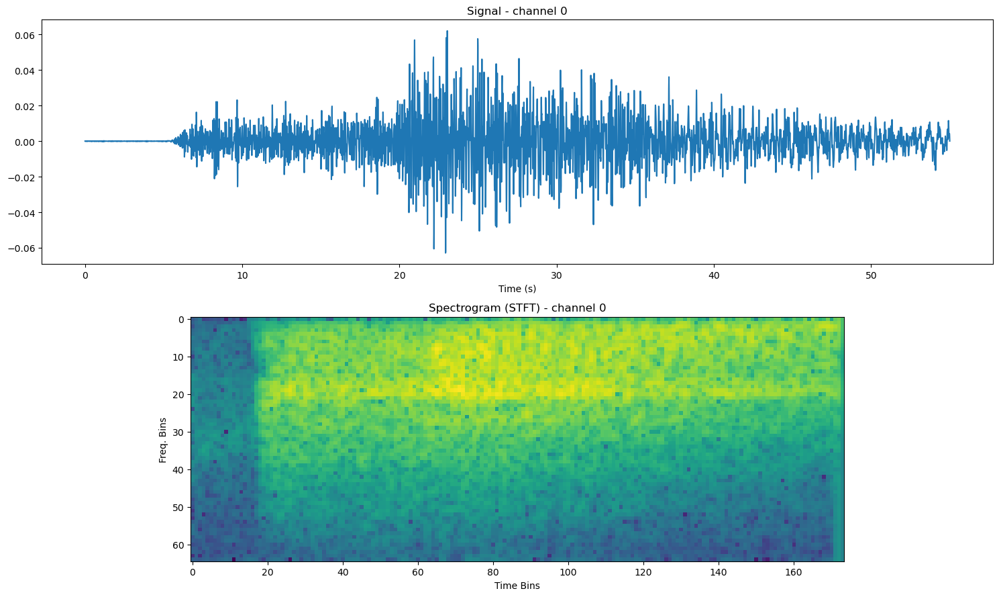

Model: LightningDiffusion
Number of learnable parameters: 38139459
Model size: 458.24 MB
UNet scheme: 
 base num. channels: 32 
 channel multipliers (down/up blocks): (1, 2, 4, 8) 
 num. ResBlocks per down/up block: 2 
 use Attention: True 
 conv. kernel size: 5 
Diffusion prediction type: sample
Learning rate schedule: 
 start: 0.0003 
 scheduler: cosine 
 warmup steps: 400
Batch size: 150
Downsampling factor: 2. The model was trained on signals with length 2750, as the sampling rate used was 50 instead of 100
Data representation shape: (1, 3, 65, 174) - (batch_size, channels, freq_bins, time_frames)
Data representation name: LogSpectrogram
Checkpoint: ../outputs/ddim-pred:sample-2D-downsampling:2_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=203-val_loss=0.01.ckpt - Last modified: 2024-06-23 00:57


In [8]:
model, model_data_repr, ckpt = load_model(Path(model_path_str), use_ddim=False)
model.to(device)
model.eval()
print_model_info(model, model_data_repr, ckpt)

In [9]:
!ls -al ../outputs/ddim-pred:sample-2D-downsampling:2_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=203-val_loss=0.01.ckpt


-rw-r--r-- 1 abosisio sd28 458243743 Jun 23 00:57 '../outputs/ddim-pred:sample-2D-downsampling:2_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=203-val_loss=0.01.ckpt'


Restore the sampling rate and signal length that were used during training

In [10]:
if "downsampling" in model_path_str:
    downsampling = int(model_path_str.split("downsampling:")[1].split("_")[0])
    signal_length = signal_length // downsampling
    fs = fs // downsampling
    config.signal_length = signal_length
    config.fs = fs
    print(f"Updated signal length: {config.signal_length} and fs: {config.fs}")
else:
    downsampling = 1    

Updated signal length: 2750 and fs: 50


Let's generate a batch of data

In [11]:
# Select the batch size.
batch_size = model.hparams.optimizer_params.batch_size

# One can also choose the batch size
batch_size = batch_size*2

batch_size

300

In [29]:
# Insert values for the conditional input parameters.
# Please read generate_cond_inputs documentation (in utils.py) to understand the structure of cond_input_params dictionary
cond_input_params = {
    "hypocentral_distance": [10, 100, 150],
    "is_shallow_crustal": [0],
    "magnitude": [5.5, 4, 7, 8.5],
    "vs30": None,
}

data_raw = generate_data(model, model_data_representation=model_data_repr, raw_output=True, num_samples=batch_size, cond_input_params=cond_input_params, device=device.type)
data_raw['waveforms'].shape, data_raw['cond'].shape

Batch 1/2


100%|██████████| 100/100 [00:49<00:00,  2.04it/s]


Batch 2/2


100%|██████████| 100/100 [00:48<00:00,  2.04it/s]


((300, 3, 65, 174), (300, 4))

In [30]:
data_raw_wf = data_raw['waveforms']
data_raw_wf.shape

(300, 3, 65, 174)

In [31]:
data_wf = model_data_repr.invert_representation(data_raw_wf)
data_wf.shape

(300, 3, 2750)

## Single Sample Visualization

Let's investigate model's raw output 

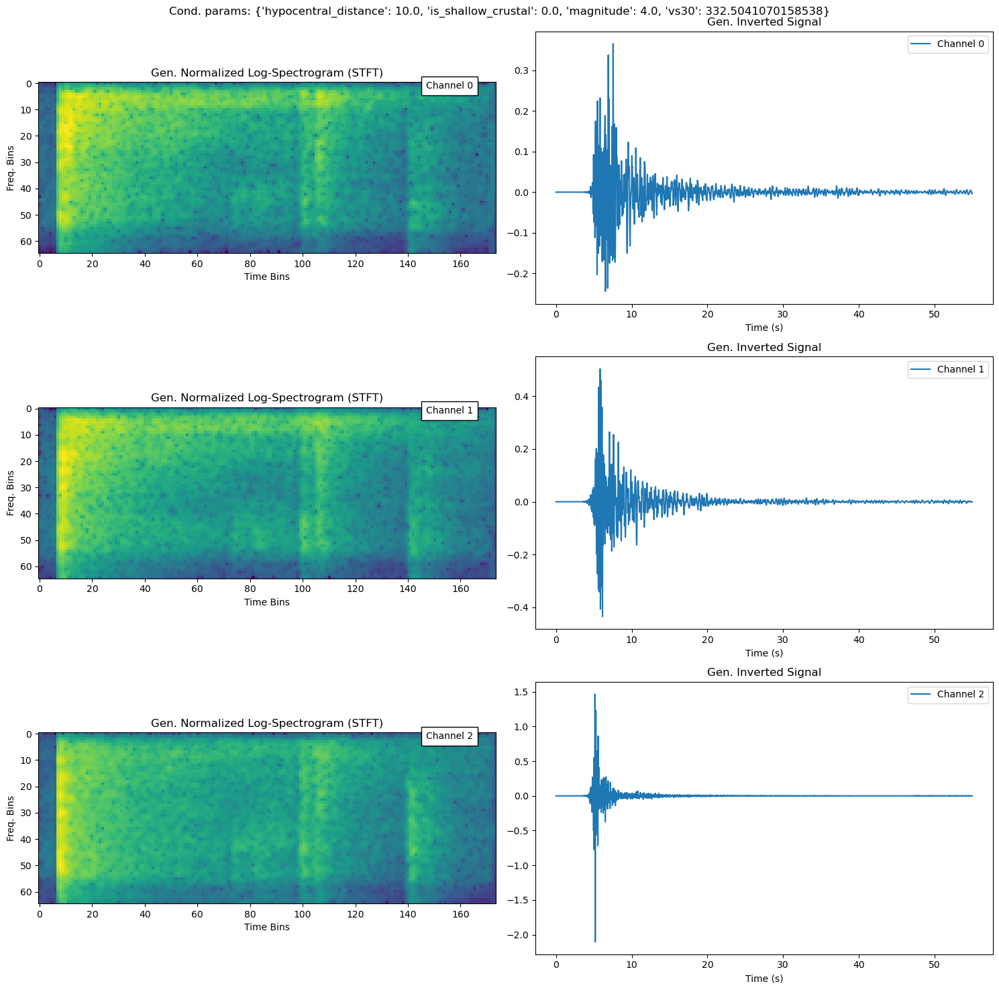

In [32]:
sample_index = 0
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

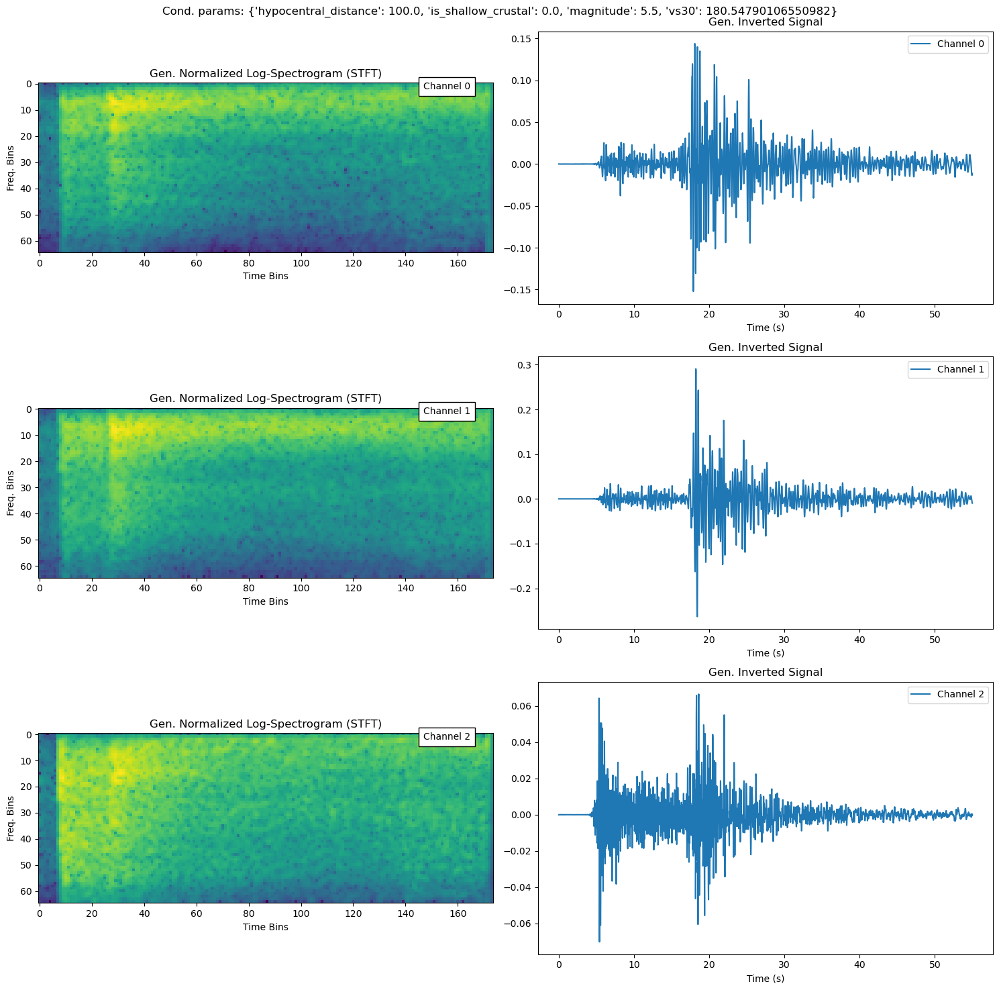

In [33]:
sample_index = 3
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

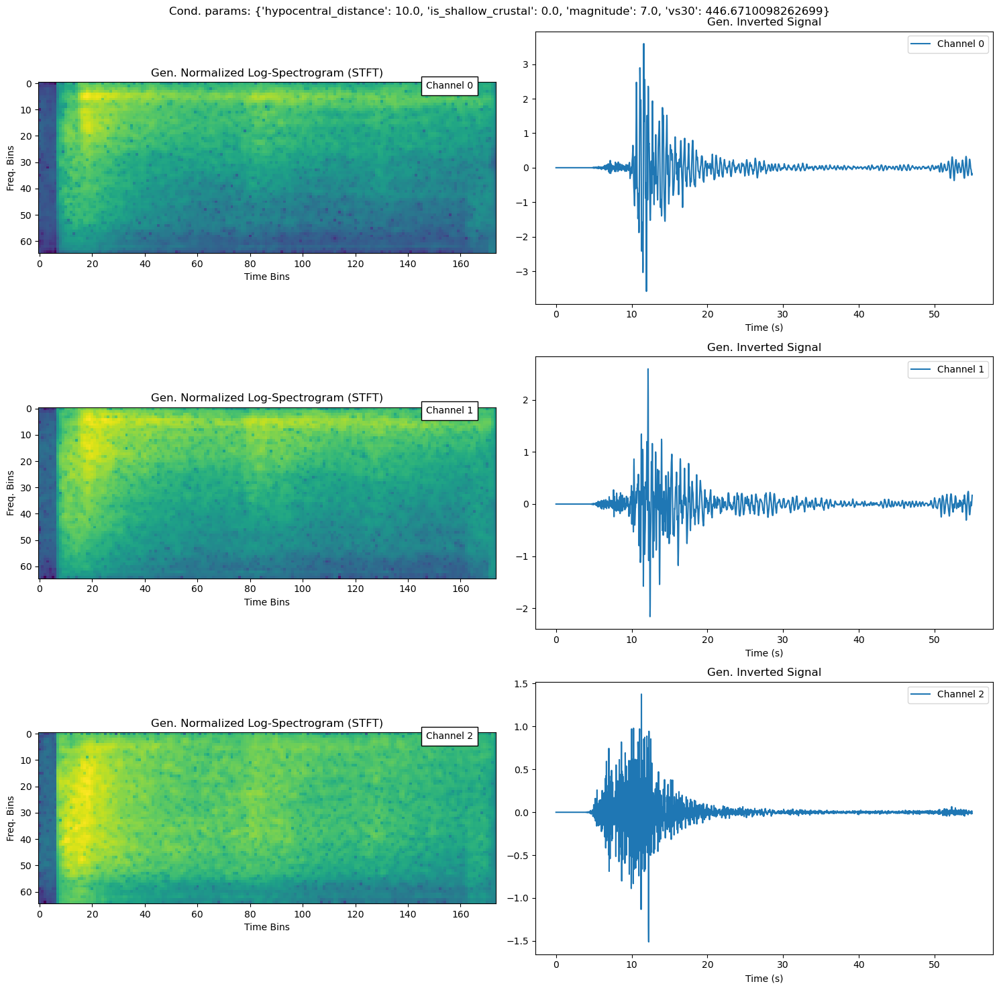

In [34]:
sample_index = 10
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

In [35]:
# TODO: works only for 1D signals, need to generalize to 2D signals. However, is only useful for 1D signals.
# max_peak_index = np.argmax(np.max(np.abs(data_raw_wf), axis=(1, 2)))
# plot_raw_waveform(data_raw_wf[max_peak_index], n_channels, data_wf[max_peak_index])

Let's now see the generated waveforms, along with their Power Spectral Density and Log Envelope. 

In [36]:
data = {"waveforms": data_wf, "cond": data_raw['cond']}

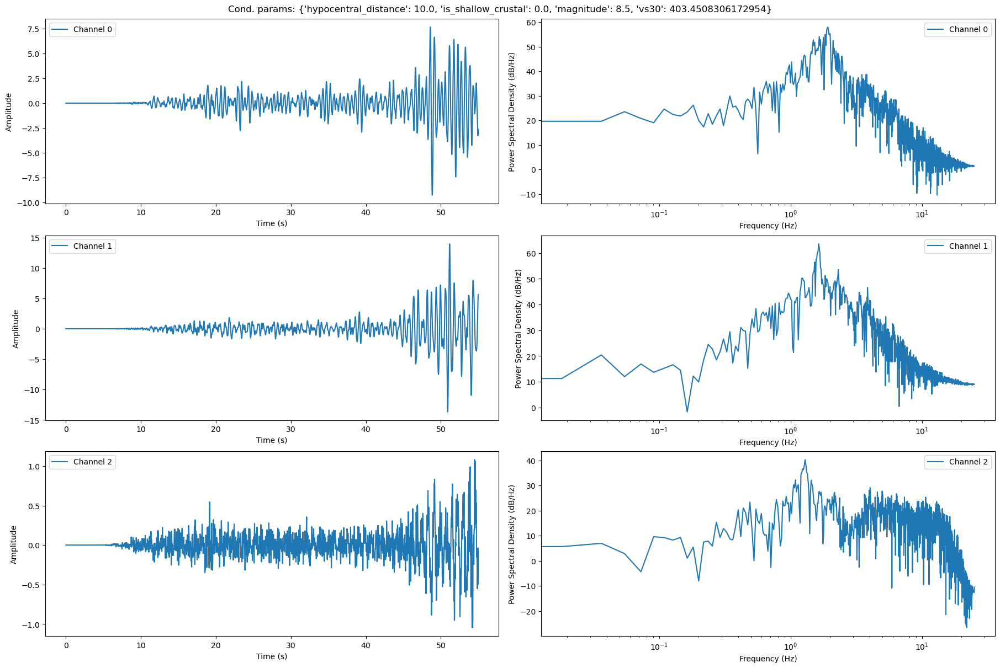

In [37]:
plot_waveform_and_psd(get_samples(data, num_samples=1))

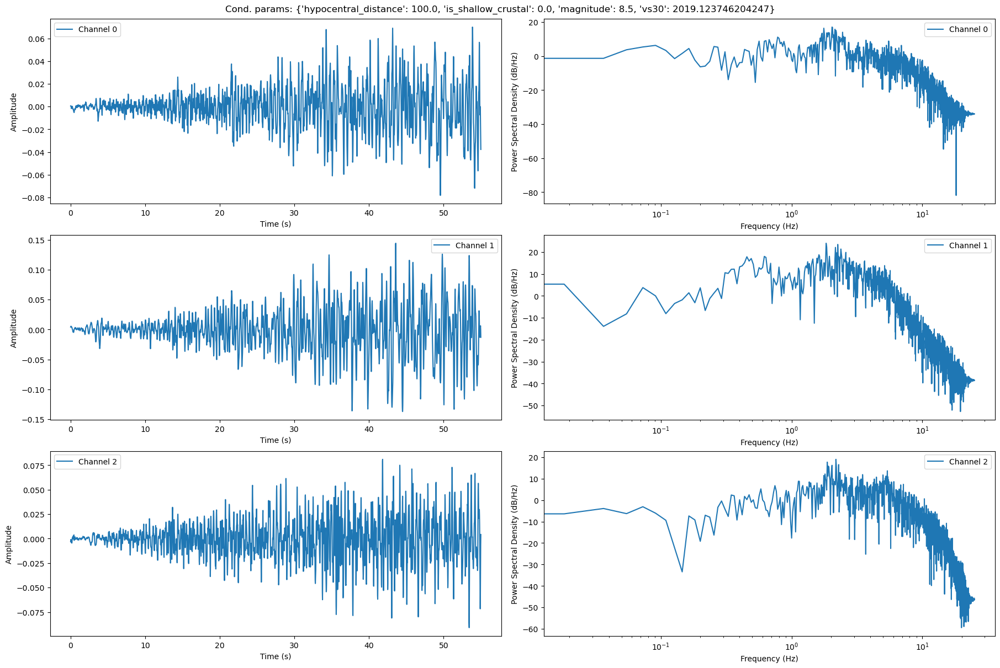

In [38]:
plot_waveform_and_psd(get_samples(data, indexes=[2]))

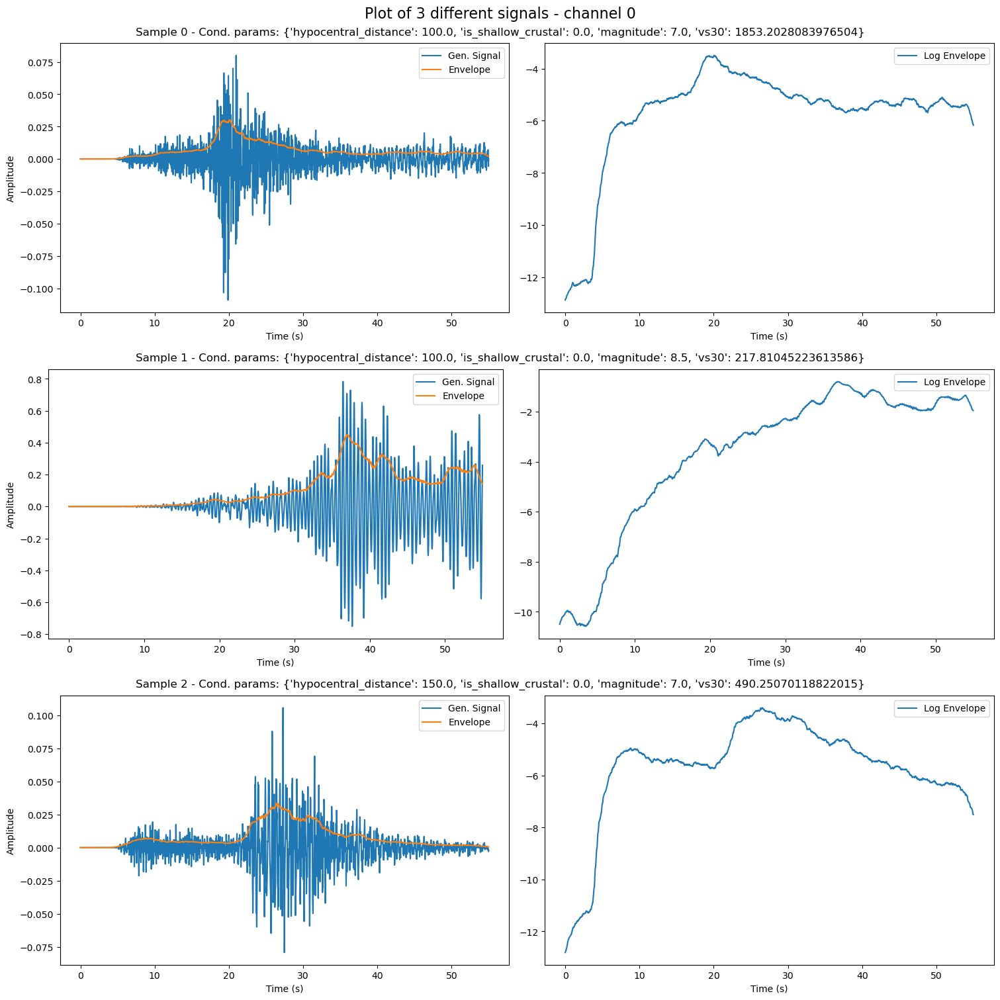

In [39]:
plot_waveforms(get_samples(data, num_samples=3), channel_index=0, plot_log_envelope=True)

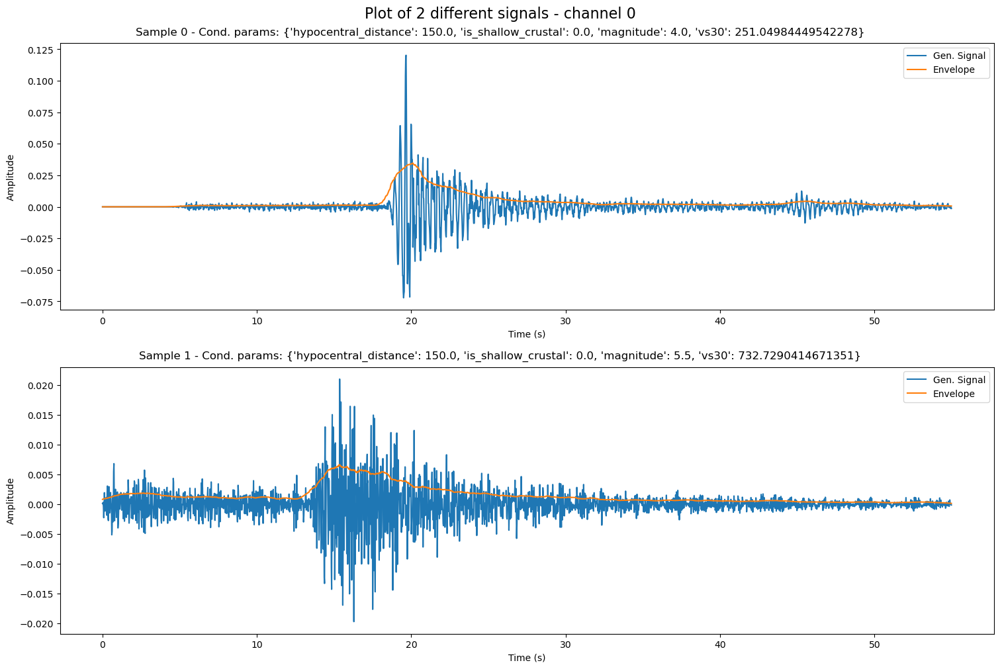

In [40]:
plot_waveforms(get_samples(data, num_samples=2), channel_index=0, plot_log_envelope=False)

## Batch Statistics

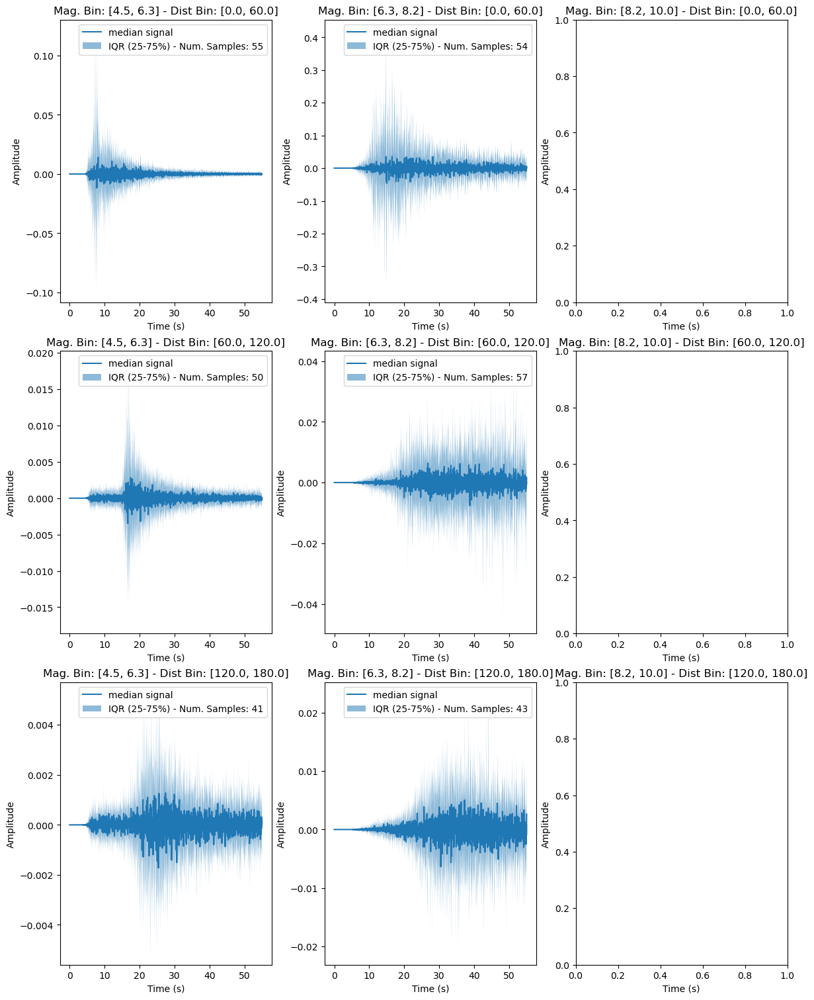

In [41]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='waveform')

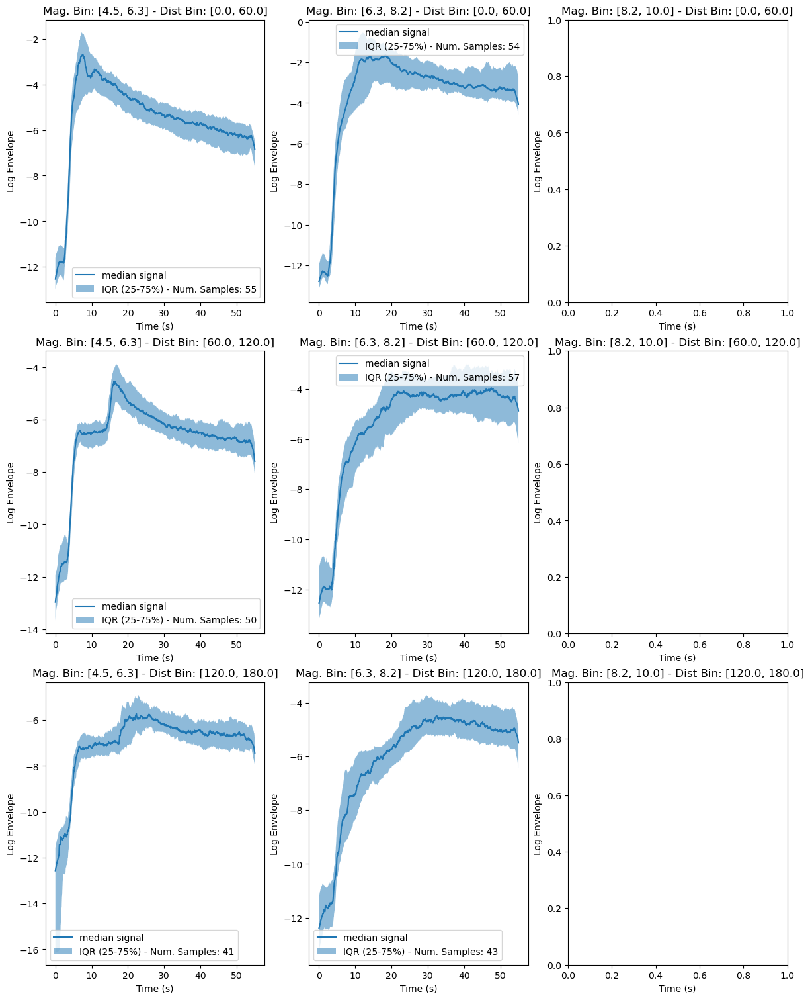

In [42]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='log_envelope')

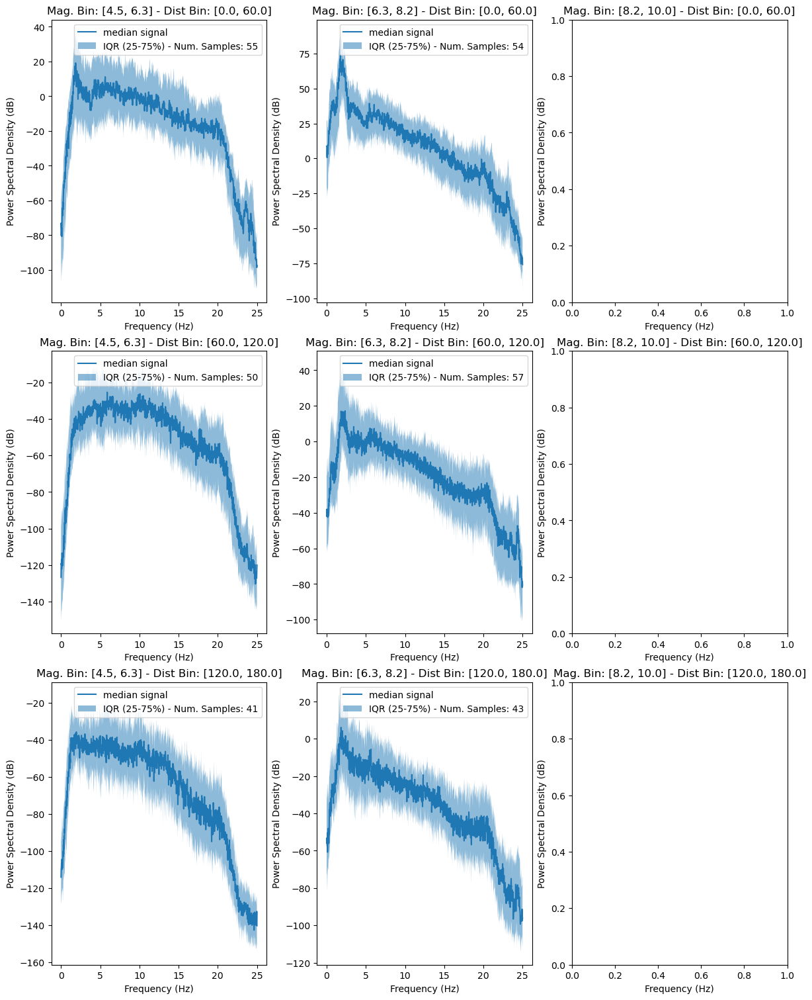

In [43]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='power_spectral_density')

In [44]:
del data
del data_raw

## Evaluation

In [12]:
from tqdne.representations import Signal

test_dataset_path = config.datasetdir / config.data_test
train_dataset_path = config.datasetdir / config.data_train

test_dataset = RepresentationDataset(test_dataset_path, Signal(), pad=config.signal_length*downsampling, downsample=downsampling)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
train_dataset = RepresentationDataset(train_dataset_path, Signal(), pad=config.signal_length*downsampling, downsample=downsampling)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

real_dataset = ConcatDataset([train_dataset, test_dataset])
real_dataloader = DataLoader(real_dataset, batch_size=batch_size, shuffle=False)


Let's generate couple of samples with the same conditioning parameters to check the expressiveness of the model and check if it lies within the true data distribution. 

Batch 1/1


100%|██████████| 100/100 [00:05<00:00, 18.50it/s]


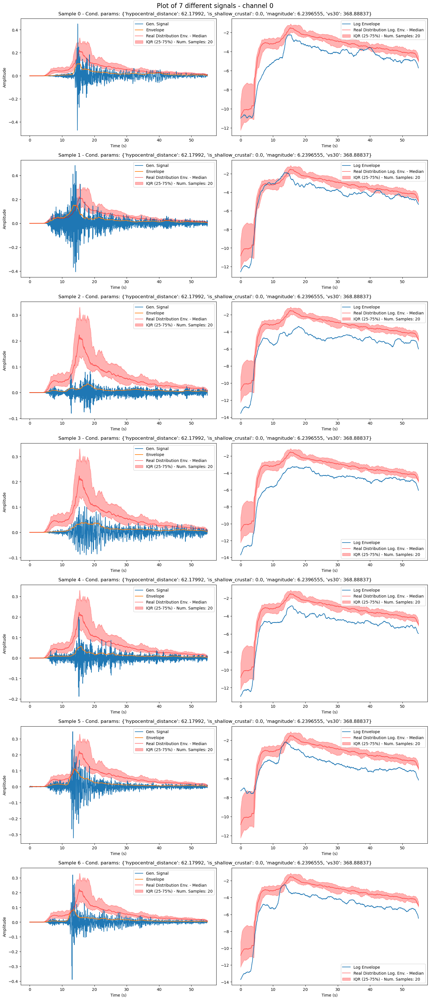

In [46]:
mag_bin = (6, 6.5)
dist_bin = (50, 70)
data_test_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = data_test_single_bin['cond'].mean(axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type)

plot_waveforms(data_pred_single_bin, test_waveforms=data_test_single_bin['waveform'])

Batch 1/1


100%|██████████| 100/100 [00:05<00:00, 18.52it/s]


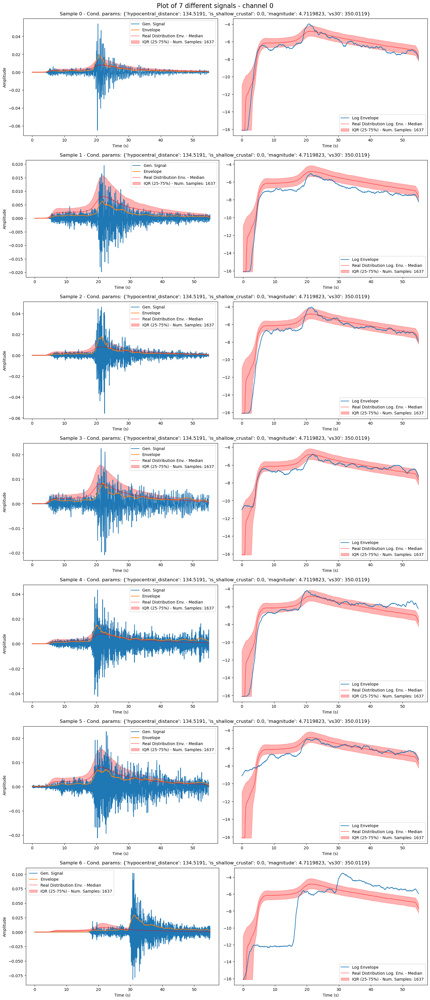

In [47]:
mag_bin = (4, 5)
dist_bin = (120, 150)
data_test_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = data_test_single_bin['cond'].mean(axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type)

plot_waveforms(data_pred_single_bin, test_waveforms=data_test_single_bin['waveform'])

Batch 1/1


100%|██████████| 100/100 [00:05<00:00, 18.56it/s]


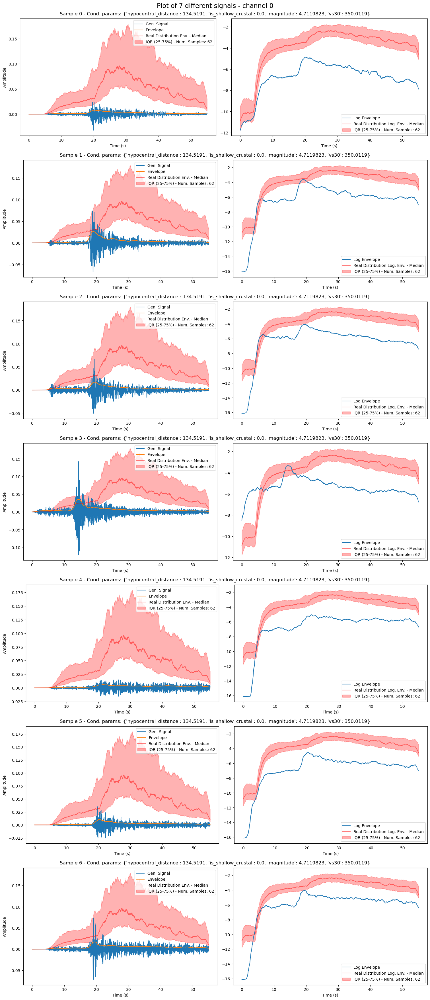

In [48]:
mag_bin = (6.5, 9.)
dist_bin = (120, 150)
data_real_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = data_test_single_bin['cond'].mean(axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type)

plot_waveforms(data_pred_single_bin, test_waveforms=data_real_single_bin['waveform'])

Let's now compare the statistics of the generated data wrt the real data.

In [13]:
real_data = {
    "waveforms": np.concatenate([test_dataset[:]['waveform'], train_dataset[:]['waveform']], axis=0),
    "cond": np.concatenate([test_dataset[:]['cond'], train_dataset[:]['cond']], axis=0)
}
real_data['waveforms'].shape, real_data['cond'].shape

((197370, 3, 2750), (197370, 4))

Now let's generate more samples to perform an analysis by dividing the data in bins (magnitude and distance). 

Let's save the generated data future use.

The data will be saved as a `dict` with keys `waveforms` and `cond` in the same place of the checkpoint of the selected model, with the same name of `ckpt`, except for the extension of the file (saved as a HDF5 `.hdf5` file).
The optimal approach for downloading the generated dataset to a local storage location is to replace the string `hdf5_filename` with the desired filename, thus enabling the file to be stored in the current directory. This file may then be downloaded via the integrated visual interface of VSCode or JupyterLab. 


In [14]:
# Save the generated waveforms along with the conditioning parameters
hdf5_filename = f"{str(ckpt).replace('.ckpt', '_new.hdf5')}"
hdf5_filepath = Path(hdf5_filename)

In [15]:
hdf5_filename

'../outputs/ddim-pred:sample-2D-downsampling:2_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=203-val_loss=0.01_new.hdf5'

In [ ]:
# Generate waveforms with the same conditioning parameters of the real data
generated_data = generate_data(
    model, 
    model_data_repr, 
    raw_output=False, 
    num_samples=real_data['waveforms'].shape[0], 
    cond_input=real_data['cond'], 
    device=device.type, 
    batch_size=batch_size,
    save_path=hdf5_filepath,
    restart=True
)

generated_data['waveforms'].shape, generated_data['cond'].shape

Batch 1/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 2/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 3/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 4/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 5/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 6/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 7/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 8/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 9/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 10/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 11/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 12/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 13/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 14/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 15/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 16/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 17/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 18/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 19/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 20/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 21/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 22/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 23/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 24/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 25/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 26/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 27/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 28/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 29/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 30/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 31/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 32/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 33/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 34/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 35/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 36/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 37/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 38/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 39/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 40/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 41/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 42/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 43/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 44/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 45/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 46/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 47/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 48/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 49/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 50/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 51/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 52/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 53/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 54/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 55/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 56/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 57/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 58/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 59/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 60/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 61/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 62/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 63/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 64/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 65/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 66/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 67/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 68/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 69/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 70/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 71/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 72/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Batch 73/90


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Let's check the raw outputs by comparing them statistically with real data in the representation domain. 

In [ ]:
#plot_raw_output_distribution(generated_raw_data["waveforms"], real_dataset.waveforms, model_data_repr)

In [16]:
# check if generated_data is available
if 'generated_data' in locals():
    #generated_data = {"waveforms": model_data_repr.invert_representation(generated_raw_data['waveforms']), "cond": generated_raw_data['cond']}
    #del generated_raw_data
    # if samples are available in a preexisting file, append the new samples to generated_data
    if hdf5_filepath.exists():
        with h5py.File(hdf5_filepath, 'r') as f:
            generated_data = {k: np.concatenate([generated_data[k], f[k][:]], axis=0) for k in generated_data.keys()}
else:
    # load the file hdf5_filename
    with h5py.File(hdf5_filepath, 'r') as f:
        generated_data = {"waveforms": f['waveforms'][:], "cond": f['cond'][:]}

generated_data['waveforms'].shape, generated_data['cond'].shape

((197370, 3, 2750), (197370, 4))

In [17]:
with h5py.File(hdf5_filepath, 'r') as f:
    generated_data = {"waveforms": f['waveforms'][:], "cond": f['cond'][:]}

generated_data['waveforms'].shape, generated_data['cond'].shape

((197370, 3, 2750), (197370, 4))

In [21]:
real_data['waveforms'].shape, real_data['cond'].shape

((197370, 3, 2750), (197370, 4))

And let's now compare the generated data against the real ones. 

In [18]:
distance_bins = [(0, 40), (40, 60), (60, 80), (80.0, 120.), (120., 150.), (150., 200.)]
magnitude_bins = [(4.5, 5.0), (5., 5.5), (5.5, 6.5), (6.5, 7.5)]

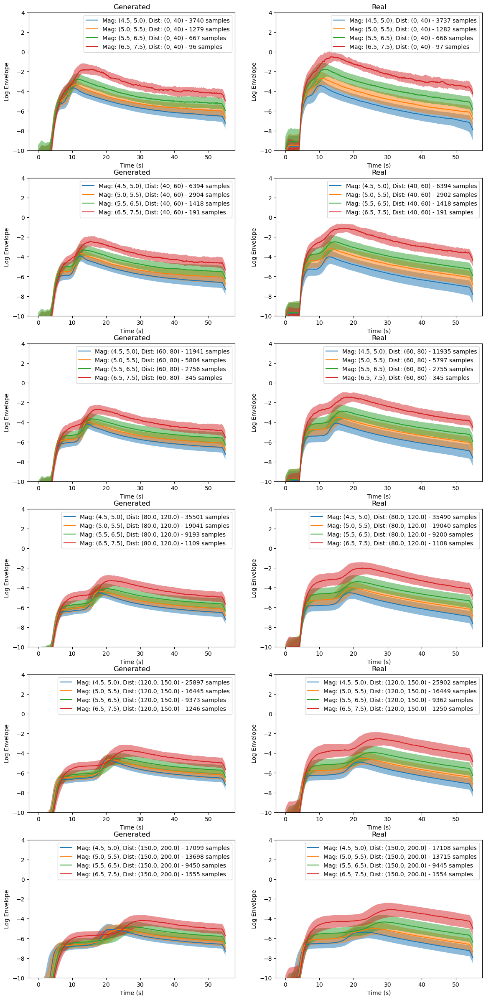

In [19]:
plot_bins(
    plot_type='log_envelope',
    distance_bins=distance_bins,
    magnitude_bins=magnitude_bins,
    channel_index=0,
    test_data=real_data, 
    data=generated_data, 
    model=model,
    model_data_representation = model_data_repr
)

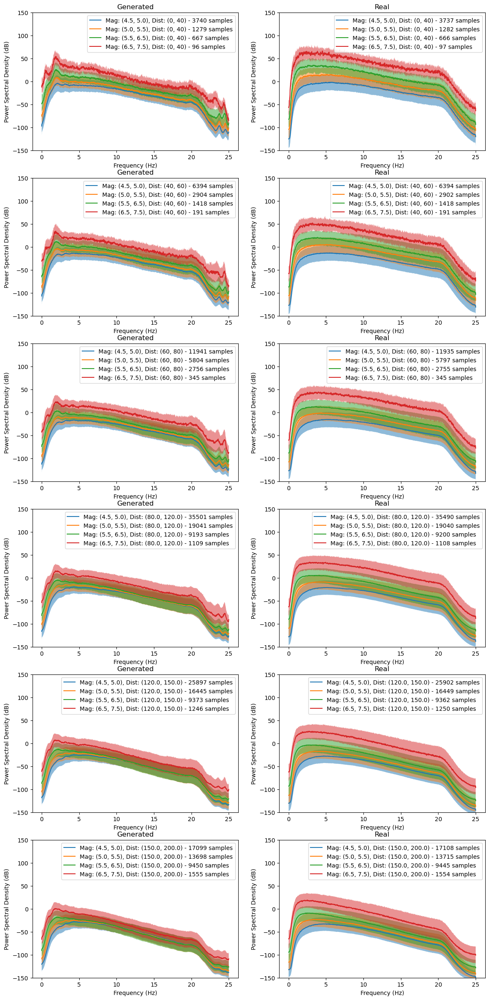

In [20]:
plot_bins(
    plot_type='power_spectral_density',
    distance_bins=distance_bins,
    magnitude_bins=magnitude_bins,
    channel_index=0,
    test_data=real_data, 
    data=generated_data, 
    model=model,
    model_data_representation=model_data_repr
)

Visualize the whole distribution in terms of Power Spectral Density and Envelope. 

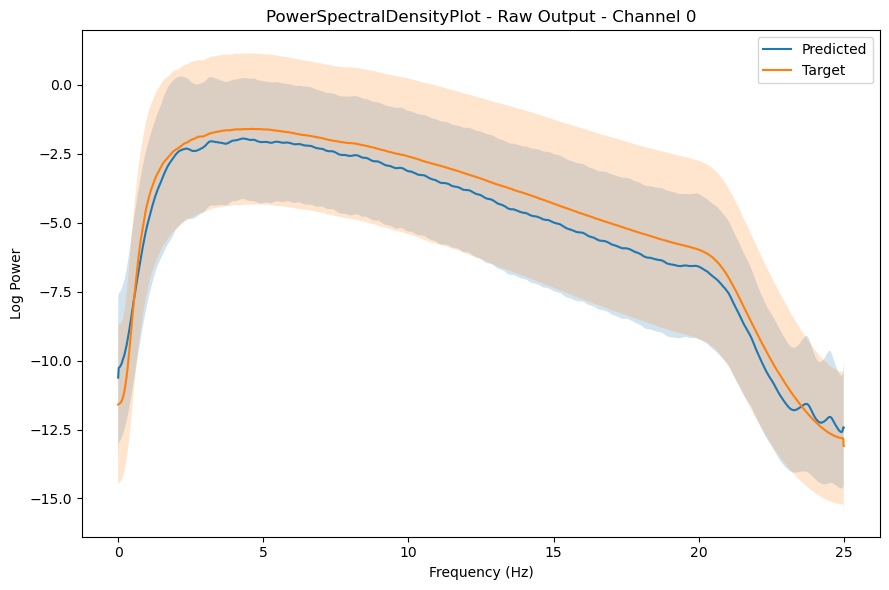

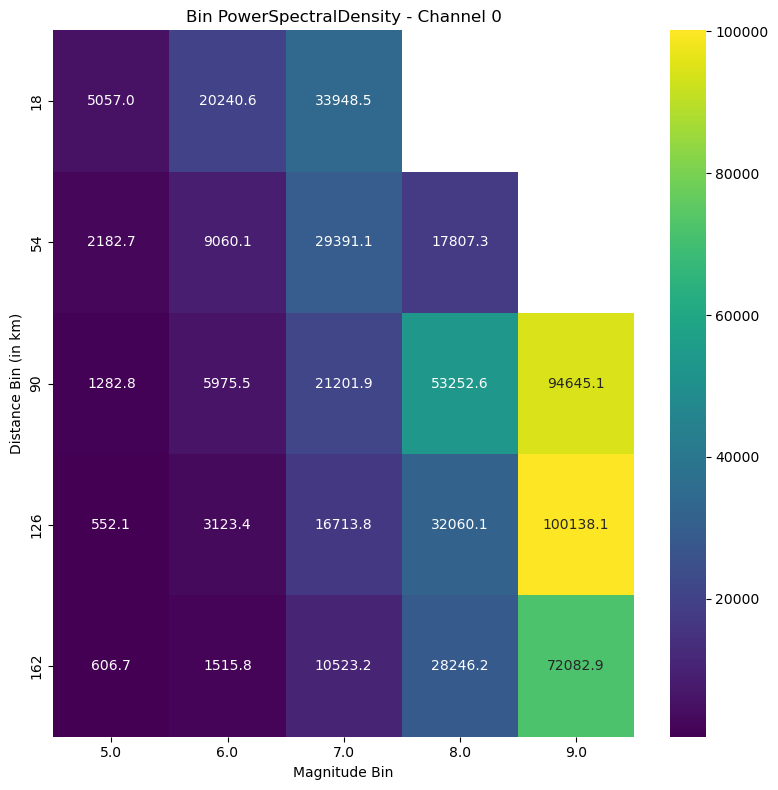

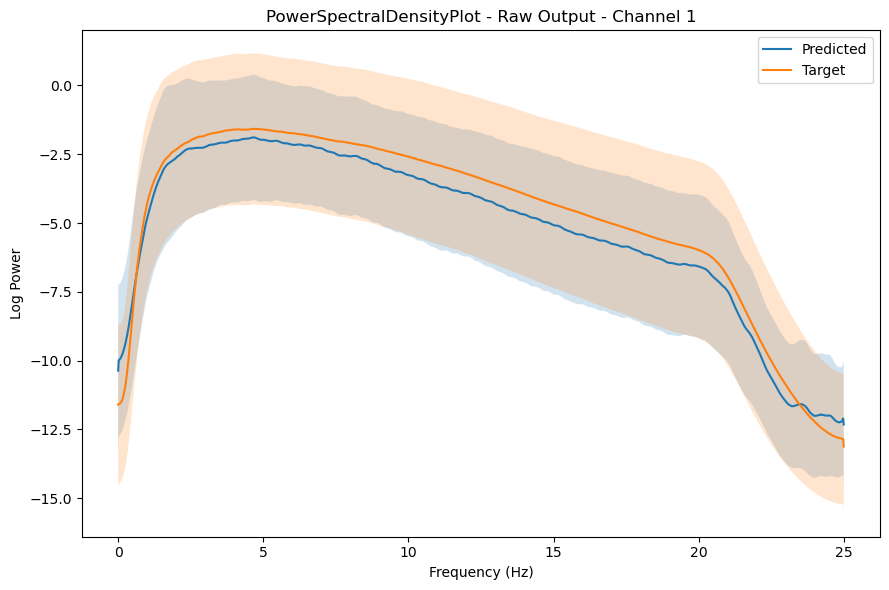

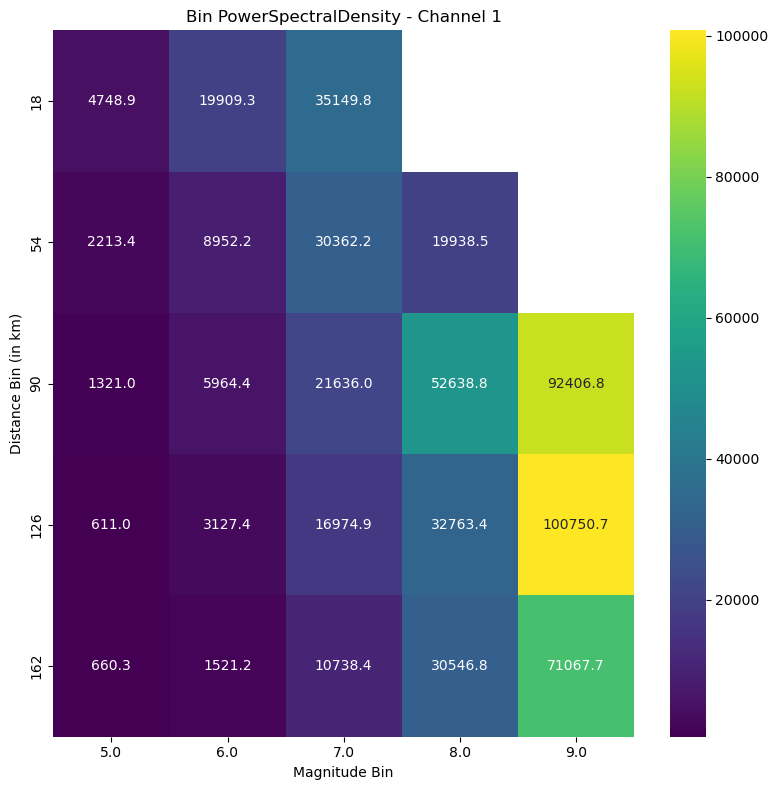

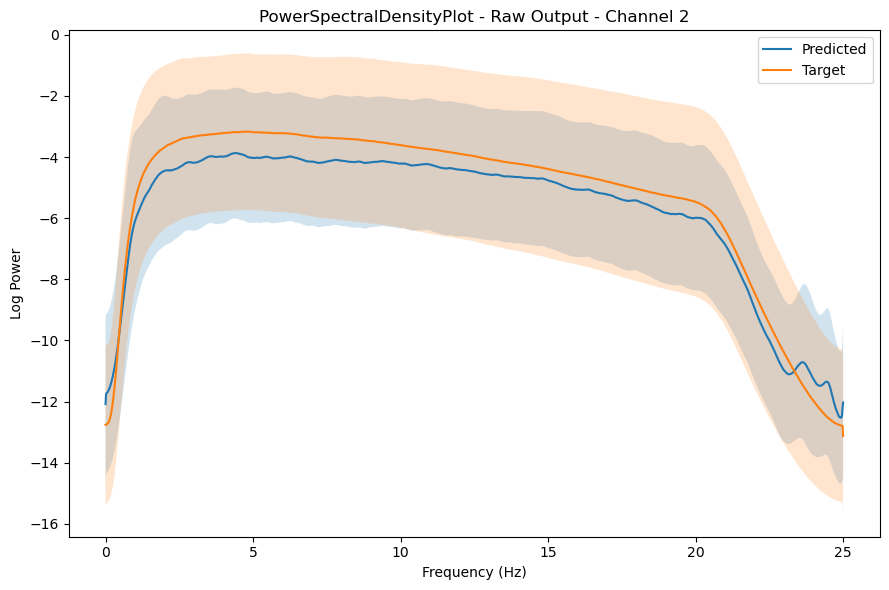

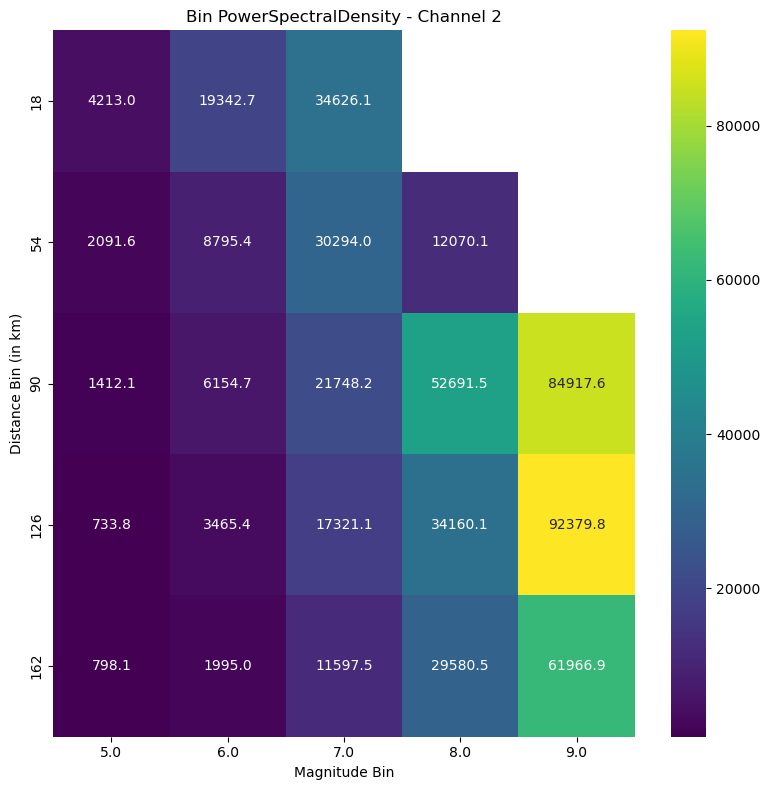

In [43]:
from tqdne.plot import PowerSpectralDensityPlot, BinPlot
from tqdne.metric import PowerSpectralDensity

psd_metrics = [PowerSpectralDensity(fs, channel=channel, invert_representation=False) for channel in range(n_channels)]
psd_plots = [PowerSpectralDensityPlot(fs, channel, invert_representation=False) for channel in range(n_channels)]
for i, psd in enumerate(psd_metrics):
    psd_plots[i](preds=generated_data['waveforms'], target=real_data['waveforms'])
    psd(preds=generated_data['waveforms'], target=real_data['waveforms'])    
    psd_bin = BinPlot(psd, num_mag_bins=5, num_dist_bins=5)
    psd_bin(preds=generated_data['waveforms'], target=real_data['waveforms'], cond=real_data['cond'])

In [ ]:
from tqdne.plot import LogEnvelopePlot
from tqdne.metric import LogEnvelope

logenv_metrics = [LogEnvelope(channel=channel, invert_representation=False) for channel in range(n_channels)]
logenv_plots = [LogEnvelopePlot(fs, channel, invert_representation=False) for channel in range(n_channels)]
for i, logenv in enumerate(logenv_metrics):
    logenv_plots[i](preds=generated_data['waveforms'], target=real_data['waveforms'])
    logenv(preds=generated_data['waveforms'], target=real_data['waveforms'])    
    logenv_bin = BinPlot(psd, num_mag_bins=5, num_dist_bins=5)
    logenv_bin(preds=generated_data['waveforms'], target=real_data['waveforms'], cond=real_data['cond'])

### Evaluation using a classifier

In [40]:
classifier_path = Path("/users/abosisio/scratch/tqdne/outputs/classifier-2D-32Chan-(1, 2, 4, 8)Mult-2ResBlocks-4AttHeads_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=45-val_loss=0.87.ckpt")
classifier, classifier_data_repr, classifier_ckpt = load_model(classifier_path, use_ddim=False)
classifier_ckpt

/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'net' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['net'])`.
/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.


PosixPath('/users/abosisio/scratch/tqdne/outputs/classifier-2D-32Chan-(1, 2, 4, 8)Mult-2ResBlocks-4AttHeads_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=45-val_loss=0.87.ckpt')

#### Compute Fréchet Inception Distance (FID)

In [41]:
from tqdne.metric import compute_fid

fid_train_vs_test = compute_fid(
    classifier.get_embeddings(train_dataloader, classifier_data_repr), 
    classifier.get_embeddings(test_dataloader, classifier_data_repr)
)
print(f"FID baseline (train (N={len(train_dataset)}) vs test (N={len(test_dataset)})): {fid_train_vs_test}")


fid_real_vs_generated = compute_fid(
    classifier.get_embeddings(real_dataloader, classifier_data_repr), 
    classifier.get_embeddings(generated_data['waveforms'], classifier_data_repr)
)
print(f"FID (real (N={len(real_dataset)}) vs generated (N={generated_data['waveforms'].shape[0]})): {fid_real_vs_generated}")


100%|██████████| 50/50 [00:47<00:00,  1.06it/s]


FID baseline (train (N=182523) vs test (N=14847)): 0.004295315525379095


100%|██████████| 256/256 [06:16<00:00,  1.47s/it]


FID (real (N=197370) vs generated (N=197370)): 0.8948820900554217


#### Compute Inception Score

In [42]:
from tqdne.metric import compute_inception_score

print("Inception Score:", compute_inception_score(classifier.get_probabilities(generated_data['waveforms'], classifier_data_repr)))

100%|██████████| 256/256 [06:14<00:00,  1.46s/it]

Inception Score: 2.522220816718941


## TODOs

In [ ]:
# TODO: widgets do not work

# from tqdne.metric import PowerSpectralDensity, BinMetric
# import ipywidgets as widgets
# from functools import partial

# metrics = {"Power Spectral Density": partial(PowerSpectralDensity, fs=config.fs)}

# # Create a dropdown for selecting the metric
# metric_dropdown = widgets.Dropdown(
#     options=metrics.keys(),
#     description='Metric:',
# )

# # Create a slider for selecting the channel
# channel_slider = widgets.IntSlider(
#     value=0,
#     min=0,
#     max=2,
#     step=1,
#     description='Channel:',
#     disabled=False,
#     continuous_update=False,
#     orientation='horizontal',
#     readout=True,
#     readout_format='d'
# )


# # Bin plot checkbox
# bin_plot_checkbox = widgets.Checkbox(
#     value=False,
#     description='Plot bins',
#     disabled=False,
#     indent=True,
# )

# # Create a slider for selecting the number of bins
# num_bins_slider = widgets.IntSlider(
#     value=10,
#     min=1,
#     max=50,
#     step=1,
#     description='Num bins:',
#     disabled=False,
#     continuous_update=False,
#     orientation='horizontal',
#     readout=True,
#     readout_format='d'
# )

# # Function to update the plot
# def update_plot(metric_name, bin_plot, num_bins=10, channel=0):
#     metric = metrics[metric_name](channel=channel)
#     if bin_plot:
#         metric = BinMetric(metric, num_mag_bins=num_bins, num_dist_bins=num_bins)

#     # Compute the metric
#     metric.reset()
#     metric.update(pred={"generated": pred_waveforms}, target={"representation": test_waveforms[:, :, : pred_waveforms.shape[-1]], "cond": test_features})
#     metric.plot().show()

# # Create interactive plot
# widgets.interact(update_plot, metric_name=metric_dropdown, channel=channel_slider, bin_plot=bin_plot_checkbox, num_bins=num_bins_slider)



In [ ]:
print('done')

In [ ]:
# # Save the data to obspy format
# from obspy import Stream, Trace

# # Convert waveforms to Trace objects
# traces = [Trace(data=waveform, header={k:v for k, v in get_cond_params_dict(pred_data["cond"][i])}) for i, waveform in enumerate(pred_data["waveforms"])]

# # Create a Stream object
# st = Stream(traces=traces)

# # Save the Stream object to a file
# st.write("generated_waveforms.mseed", format="MSEED", reclen=512, encoding="FLOAT64")
